# Getting Started with Images in OpenCV

In the previous notebook, we learned that images are numerical tensors.

In this notebook, we will get more practical. We will use **OpenCV** to perform common image operations such as:

- reading images
- understanding BGR vs RGB channel order
- changing brightness and contrast
- flipping and rotating images
- thresholding
- blurring
- edge detection
- drawing on images
- saving processed images

The goal is not to memorize functions. The goal is to understand that image processing is mostly about transforming pixel values.

## 1. Setup

OpenCV is usually imported as `cv2`.

We will use:

- `cv2` for image processing
- `numpy` for numerical operations
- `matplotlib` for displaying images inside the notebook
- `skimage.data` only to get a public sample image

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from pathlib import Path

print("OpenCV version:", cv2.__version__)

OpenCV version: 4.13.0


## 2. Creating a Sample Image File

OpenCV usually reads images from files.

To keep this notebook runnable for everyone, we will use a public sample image from `scikit-image`, then save it as a local file.

The sample image is originally in RGB format, but OpenCV saves and reads color images in **BGR** format.

In [ ]:
# Create an output folder for generated files
output_dir = Path("opencv_outputs")
output_dir.mkdir(exist_ok=True)

# Load a public RGB sample image from scikit-image
sample_rgb = data.astronaut()

# Convert RGB to BGR before saving with OpenCV
sample_bgr = cv2.cvtColor(sample_rgb, cv2.COLOR_RGB2BGR)

sample_path = output_dir / "astronaut_sample.jpg"
cv2.imwrite(str(sample_path), sample_bgr)

print("Saved sample image to:", sample_path)
print("Sample RGB shape:", sample_rgb.shape)
print("Sample RGB dtype:", sample_rgb.dtype)

Saved sample image to: opencv_outputs/astronaut_sample.jpg
Sample RGB shape: (512, 512, 3)
Sample RGB dtype: uint8


## 3. Reading an Image with OpenCV

The main OpenCV function for reading images is:

```python
cv2.imread(path)
```

Important detail:

```python
cv2.imread(...)
```

loads color images as **BGR**, not RGB.

That means the channel order is:

```python
Blue, Green, Red
```

instead of:

```python
Red, Green, Blue
```

In [ ]:
image_bgr = cv2.imread(str(sample_path))

print("Image type:", type(image_bgr))
print("Image shape:", image_bgr.shape)
print("Image dtype:", image_bgr.dtype)
print("Minimum pixel value:", image_bgr.min())
print("Maximum pixel value:", image_bgr.max())

Image type: <class 'numpy.ndarray'>
Image shape: (512, 512, 3)
Image dtype: uint8
Minimum pixel value: 0
Maximum pixel value: 255


## 4. Displaying OpenCV Images Correctly

Matplotlib expects color images in RGB format.

OpenCV loads color images in BGR format.

So if we display an OpenCV image directly with Matplotlib, the colors will look wrong.

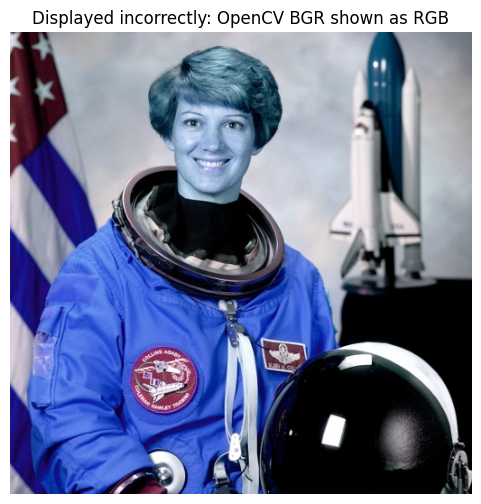

In [ ]:
plt.figure(figsize=(6, 6))
plt.imshow(image_bgr)
plt.title("Displayed incorrectly: OpenCV BGR shown as RGB")
plt.axis("off")
plt.show()

To display the image correctly, we convert it from BGR to RGB.

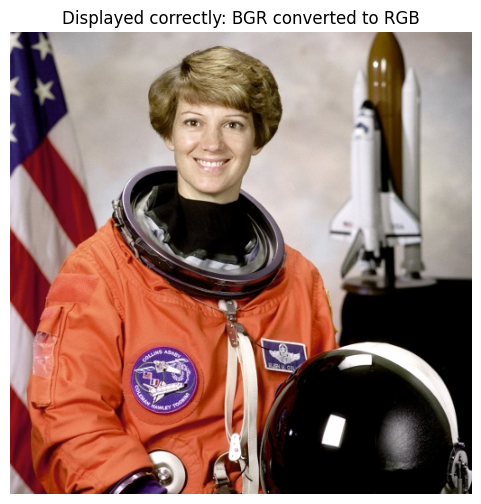

In [ ]:
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(6, 6))
plt.imshow(image_rgb)
plt.title("Displayed correctly: BGR converted to RGB")
plt.axis("off")
plt.show()

We will define a small helper function so we can display images more easily throughout the notebook.

This function expects RGB images for color display and grayscale images for grayscale display.

In [ ]:
def show_image(image, title="Image", cmap=None, figsize=(6, 6)):
    plt.figure(figsize=figsize)
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis("off")
    plt.show()

show_image(image_rgb, "Helper display: RGB image")

## 5. BGR vs RGB Channel Order

Let's inspect one pixel.

In OpenCV's BGR image, the pixel order is:

```python
[B, G, R]
```

In the RGB version, the pixel order is:

```python
[R, G, B]
```

In [ ]:
row = 120
col = 180

bgr_pixel = image_bgr[row, col]
rgb_pixel = image_rgb[row, col]

print(f"Pixel location: row={row}, col={col}")
print("BGR pixel from OpenCV image:", bgr_pixel)
print("RGB pixel after conversion:", rgb_pixel)

Pixel location: row=120, col=180
BGR pixel from OpenCV image: [140 165 197]
RGB pixel after conversion: [197 165 140]


Now let's split the channels.

For a BGR image:

```python
blue, green, red = cv2.split(image_bgr)
```

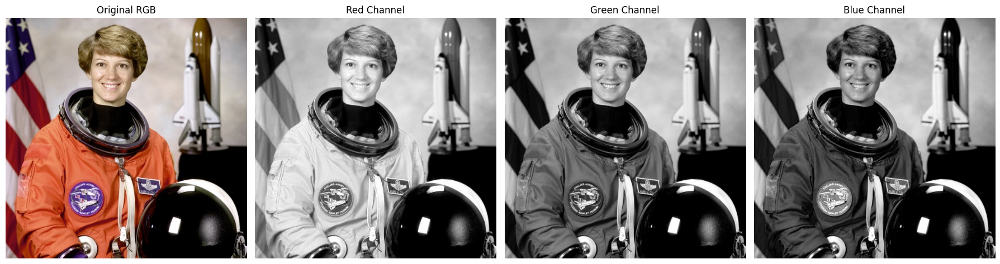

In [ ]:
blue_channel, green_channel, red_channel = cv2.split(image_bgr)

fig, axes = plt.subplots(1, 4, figsize=(18, 5))

axes[0].imshow(image_rgb)
axes[0].set_title("Original RGB")
axes[0].axis("off")

axes[1].imshow(red_channel, cmap="gray", vmin=0, vmax=255)
axes[1].set_title("Red Channel")
axes[1].axis("off")

axes[2].imshow(green_channel, cmap="gray", vmin=0, vmax=255)
axes[2].set_title("Green Channel")
axes[2].axis("off")

axes[3].imshow(blue_channel, cmap="gray", vmin=0, vmax=255)
axes[3].set_title("Blue Channel")
axes[3].axis("off")

plt.tight_layout()
plt.show()

## 6. Brightness Adjustment

Brightness changes the overall intensity of the image.

A simple way to increase brightness is to add a constant value to every pixel.

A simple way to decrease brightness is to subtract a constant value from every pixel.

But pixel values should stay between `0` and `255` for `uint8` images.

OpenCV provides a useful function:

```python
cv2.convertScaleAbs(image, alpha=..., beta=...)
```

Here:

- `alpha` controls contrast-like scaling
- `beta` controls brightness shift

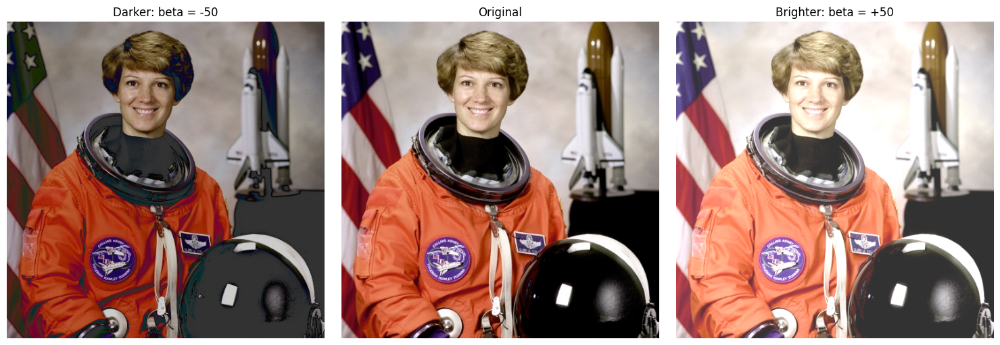

In [ ]:
brighter_bgr = cv2.convertScaleAbs(image_bgr, alpha=1.0, beta=50)
darker_bgr = cv2.convertScaleAbs(image_bgr, alpha=1.0, beta=-50)

brighter_rgb = cv2.cvtColor(brighter_bgr, cv2.COLOR_BGR2RGB)
darker_rgb = cv2.cvtColor(darker_bgr, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(darker_rgb)
axes[0].set_title("Darker: beta = -50")
axes[0].axis("off")

axes[1].imshow(image_rgb)
axes[1].set_title("Original")
axes[1].axis("off")

axes[2].imshow(brighter_rgb)
axes[2].set_title("Brighter: beta = +50")
axes[2].axis("off")

plt.tight_layout()
plt.show()

## 7. Contrast Adjustment

Contrast controls the difference between dark and bright regions.

A simple way to change contrast is to multiply pixel values by a factor.

Using OpenCV:

```python
cv2.convertScaleAbs(image, alpha=contrast_factor, beta=brightness_shift)
```

Here:

- `alpha < 1.0` lowers contrast
- `alpha > 1.0` increases contrast

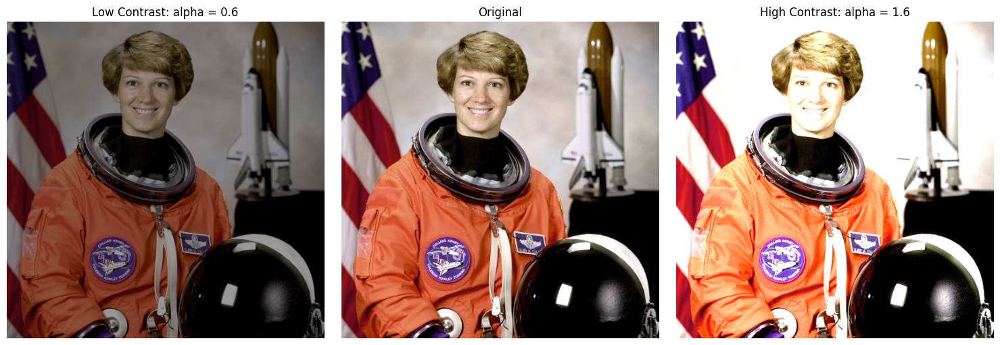

In [ ]:
low_contrast_bgr = cv2.convertScaleAbs(image_bgr, alpha=0.6, beta=0)
high_contrast_bgr = cv2.convertScaleAbs(image_bgr, alpha=1.6, beta=0)

low_contrast_rgb = cv2.cvtColor(low_contrast_bgr, cv2.COLOR_BGR2RGB)
high_contrast_rgb = cv2.cvtColor(high_contrast_bgr, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(low_contrast_rgb)
axes[0].set_title("Low Contrast: alpha = 0.6")
axes[0].axis("off")

axes[1].imshow(image_rgb)
axes[1].set_title("Original")
axes[1].axis("off")

axes[2].imshow(high_contrast_rgb)
axes[2].set_title("High Contrast: alpha = 1.6")
axes[2].axis("off")

plt.tight_layout()
plt.show()

## 8. Flipping Images

Flipping is commonly used in image processing and data augmentation.

OpenCV uses:

```python
cv2.flip(image, flipCode)
```

The `flipCode` controls the direction:

- `1` means horizontal flip
- `0` means vertical flip
- `-1` means both horizontal and vertical flip

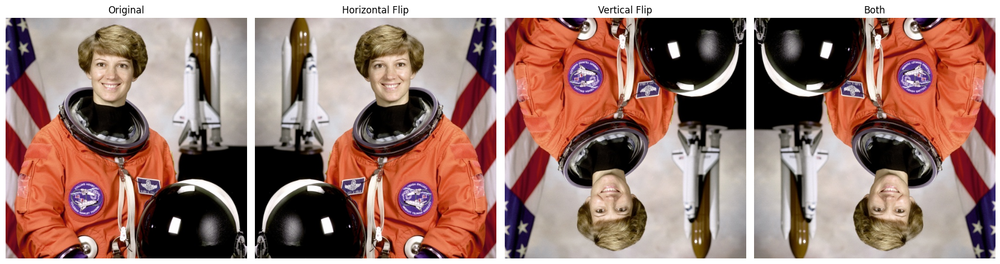

In [ ]:
flip_horizontal_bgr = cv2.flip(image_bgr, 1)
flip_vertical_bgr = cv2.flip(image_bgr, 0)
flip_both_bgr = cv2.flip(image_bgr, -1)

flip_horizontal_rgb = cv2.cvtColor(flip_horizontal_bgr, cv2.COLOR_BGR2RGB)
flip_vertical_rgb = cv2.cvtColor(flip_vertical_bgr, cv2.COLOR_BGR2RGB)
flip_both_rgb = cv2.cvtColor(flip_both_bgr, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 4, figsize=(18, 5))

axes[0].imshow(image_rgb)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(flip_horizontal_rgb)
axes[1].set_title("Horizontal Flip")
axes[1].axis("off")

axes[2].imshow(flip_vertical_rgb)
axes[2].set_title("Vertical Flip")
axes[2].axis("off")

axes[3].imshow(flip_both_rgb)
axes[3].set_title("Both")
axes[3].axis("off")

plt.tight_layout()
plt.show()

## 9. Rotating Images

OpenCV provides simple rotation helpers for common rotations:

```python
cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
cv2.rotate(image, cv2.ROTATE_180)
cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
```

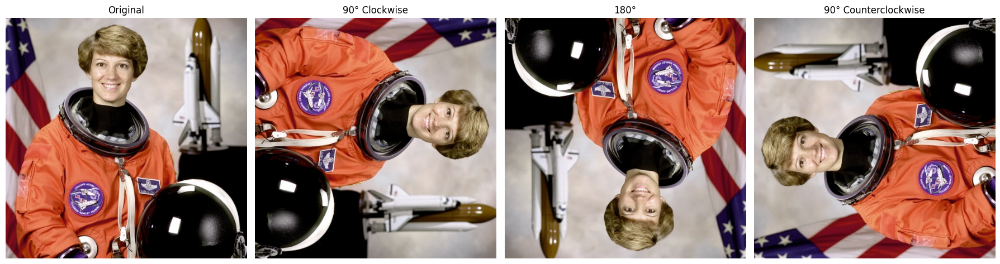

In [ ]:
rot_90_bgr = cv2.rotate(image_bgr, cv2.ROTATE_90_CLOCKWISE)
rot_180_bgr = cv2.rotate(image_bgr, cv2.ROTATE_180)
rot_270_bgr = cv2.rotate(image_bgr, cv2.ROTATE_90_COUNTERCLOCKWISE)

rot_90_rgb = cv2.cvtColor(rot_90_bgr, cv2.COLOR_BGR2RGB)
rot_180_rgb = cv2.cvtColor(rot_180_bgr, cv2.COLOR_BGR2RGB)
rot_270_rgb = cv2.cvtColor(rot_270_bgr, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 4, figsize=(18, 5))

axes[0].imshow(image_rgb)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(rot_90_rgb)
axes[1].set_title("90° Clockwise")
axes[1].axis("off")

axes[2].imshow(rot_180_rgb)
axes[2].set_title("180°")
axes[2].axis("off")

axes[3].imshow(rot_270_rgb)
axes[3].set_title("90° Counterclockwise")
axes[3].axis("off")

plt.tight_layout()
plt.show()

### Rotating by Any Angle

For arbitrary angles, we create a rotation matrix using:

```python
cv2.getRotationMatrix2D(center, angle, scale)
```

Then we apply it using:

```python
cv2.warpAffine(...)
```

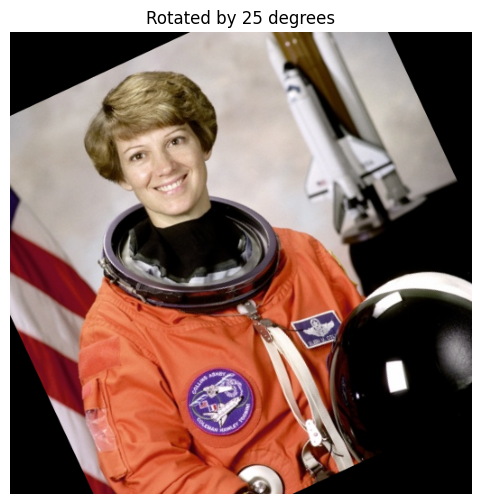

In [ ]:
height, width = image_bgr.shape[:2]
center = (width // 2, height // 2)

rotation_matrix = cv2.getRotationMatrix2D(center, angle=25, scale=1.0)
rotated_custom_bgr = cv2.warpAffine(image_bgr, rotation_matrix, (width, height))
rotated_custom_rgb = cv2.cvtColor(rotated_custom_bgr, cv2.COLOR_BGR2RGB)

show_image(rotated_custom_rgb, "Rotated by 25 degrees")

## 10. Converting to Grayscale

Many image processing operations work on grayscale images.

OpenCV conversion:

```python
cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
```

A grayscale image has shape:

```python
(height, width)
```

instead of:

```python
(height, width, 3)
```

Color image shape: (512, 512, 3)
Grayscale image shape: (512, 512)
Grayscale dtype: uint8


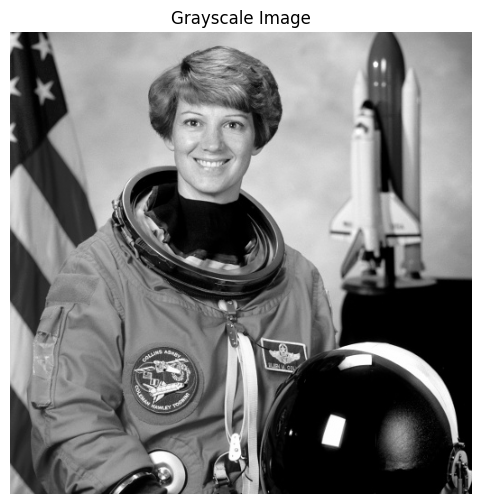

In [ ]:
gray_image = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

print("Color image shape:", image_bgr.shape)
print("Grayscale image shape:", gray_image.shape)
print("Grayscale dtype:", gray_image.dtype)

show_image(gray_image, "Grayscale Image", cmap="gray")

## 11. Thresholding

Thresholding converts a grayscale image into a binary-like image.

The idea is simple:

```python
if pixel_value > threshold:
    pixel = 255
else:
    pixel = 0
```

This can be useful for separating bright regions from dark regions.

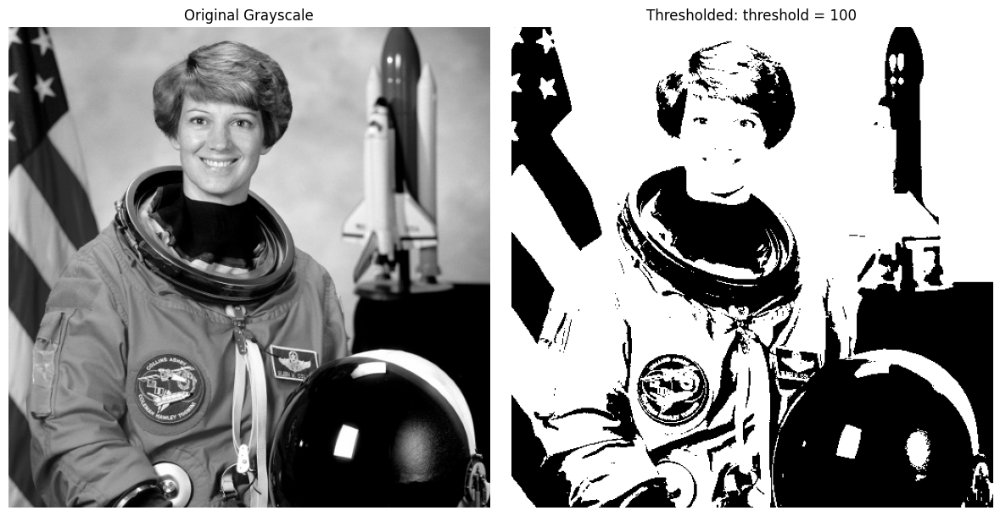

In [ ]:
threshold_value = 100
max_value = 255

_, thresholded_image = cv2.threshold(
    gray_image,
    threshold_value,
    max_value,
    cv2.THRESH_BINARY
)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(gray_image, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original Grayscale")
axes[0].axis("off")

axes[1].imshow(thresholded_image, cmap="gray", vmin=0, vmax=255)
axes[1].set_title(f"Thresholded: threshold = {threshold_value}")
axes[1].axis("off")

plt.tight_layout()
plt.show()

### Trying Multiple Thresholds

A low threshold keeps more pixels white.

A high threshold keeps fewer pixels white.

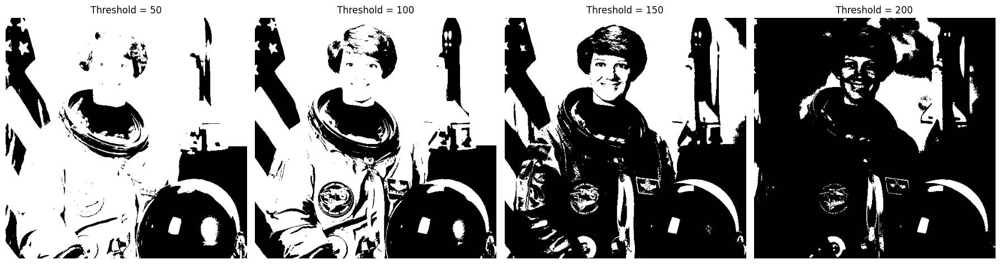

In [ ]:
thresholds = [50, 100, 150, 200]

fig, axes = plt.subplots(1, len(thresholds), figsize=(18, 5))

for ax, threshold in zip(axes, thresholds):
    _, binary = cv2.threshold(gray_image, threshold, 255, cv2.THRESH_BINARY)
    ax.imshow(binary, cmap="gray", vmin=0, vmax=255)
    ax.set_title(f"Threshold = {threshold}")
    ax.axis("off")

plt.tight_layout()
plt.show()

## 12. Blurring

Blurring smooths an image by averaging nearby pixels.

This can reduce noise, but it can also remove fine detail.

OpenCV supports several blur methods. We will use Gaussian blur:

```python
cv2.GaussianBlur(image, ksize, sigmaX)
```

The kernel size must usually be odd, such as `(3, 3)`, `(5, 5)`, or `(11, 11)`.

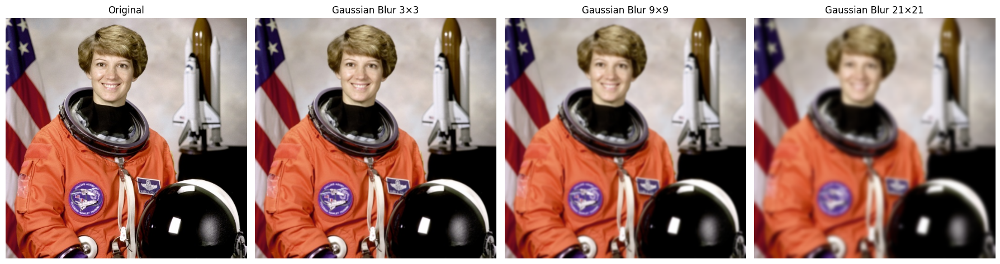

In [ ]:
blur_3 = cv2.GaussianBlur(image_bgr, (3, 3), sigmaX=0)
blur_9 = cv2.GaussianBlur(image_bgr, (9, 9), sigmaX=0)
blur_21 = cv2.GaussianBlur(image_bgr, (21, 21), sigmaX=0)

blur_3_rgb = cv2.cvtColor(blur_3, cv2.COLOR_BGR2RGB)
blur_9_rgb = cv2.cvtColor(blur_9, cv2.COLOR_BGR2RGB)
blur_21_rgb = cv2.cvtColor(blur_21, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 4, figsize=(18, 5))

axes[0].imshow(image_rgb)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(blur_3_rgb)
axes[1].set_title("Gaussian Blur 3×3")
axes[1].axis("off")

axes[2].imshow(blur_9_rgb)
axes[2].set_title("Gaussian Blur 9×9")
axes[2].axis("off")

axes[3].imshow(blur_21_rgb)
axes[3].set_title("Gaussian Blur 21×21")
axes[3].axis("off")

plt.tight_layout()
plt.show()

## 13. Edge Detection

Edges are regions where pixel intensity changes sharply.

OpenCV has a popular edge detector called **Canny edge detection**.

The function is:

```python
cv2.Canny(image, threshold1, threshold2)
```

The thresholds control how sensitive the edge detector is.

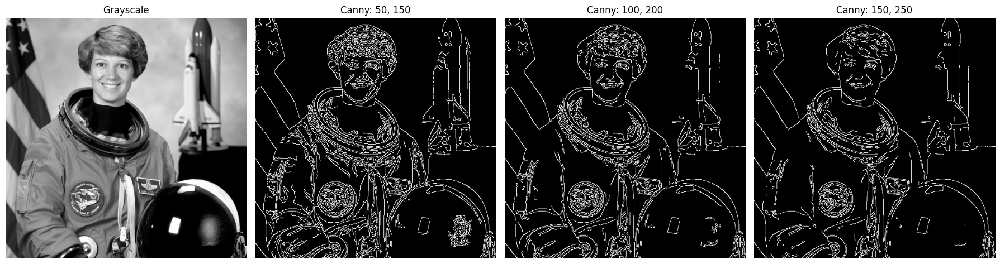

In [ ]:
edges_50_150 = cv2.Canny(gray_image, 50, 150)
edges_100_200 = cv2.Canny(gray_image, 100, 200)
edges_150_250 = cv2.Canny(gray_image, 150, 250)

fig, axes = plt.subplots(1, 4, figsize=(18, 5))

axes[0].imshow(gray_image, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Grayscale")
axes[0].axis("off")

axes[1].imshow(edges_50_150, cmap="gray")
axes[1].set_title("Canny: 50, 150")
axes[1].axis("off")

axes[2].imshow(edges_100_200, cmap="gray")
axes[2].set_title("Canny: 100, 200")
axes[2].axis("off")

axes[3].imshow(edges_150_250, cmap="gray")
axes[3].set_title("Canny: 150, 250")
axes[3].axis("off")

plt.tight_layout()
plt.show()

## 14. Drawing on Images

OpenCV can draw directly on images.

Common drawing functions include:

```python
cv2.line(...)
cv2.rectangle(...)
cv2.circle(...)
cv2.putText(...)
```

Drawing is useful for visualizing detections, annotations, bounding boxes, and labels.

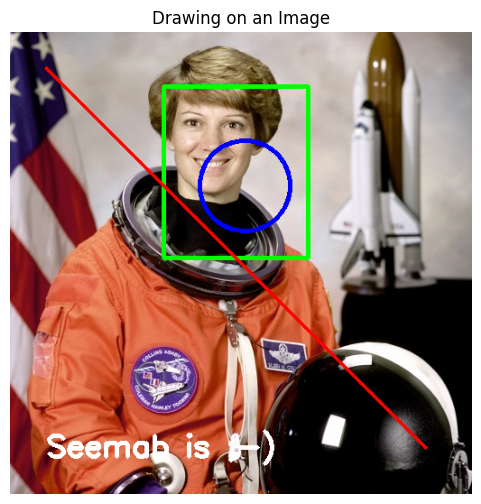

In [ ]:
drawn_bgr = image_bgr.copy()

# Draw a rectangle: image, top-left, bottom-right, color(BGR), thickness
cv2.rectangle(drawn_bgr, (170, 60), (330, 250), (0, 255, 0), 4)

# Draw a circle: image, center, radius, color(BGR), thickness
cv2.circle(drawn_bgr, (260, 170), 50, (255, 0, 0), 4)

# Draw a line: image, start, end, color(BGR), thickness
cv2.line(drawn_bgr, (40, 40), (460, 460), (0, 0, 255), 3)

# Add text: image, text, origin, font, font scale, color(BGR), thickness
cv2.putText(
    drawn_bgr,
    "Seemab is ;-)",
    (40, 470),
    cv2.FONT_HERSHEY_SIMPLEX,
    1.1,
    (255, 255, 255),
    3
)

drawn_rgb = cv2.cvtColor(drawn_bgr, cv2.COLOR_BGR2RGB)
show_image(drawn_rgb, "Drawing on an Image")

## 15. Saving Processed Images

OpenCV saves images using:

```python
cv2.imwrite(path, image)
```

Remember: if you are saving with OpenCV, it expects BGR channel order for color images.

In [ ]:
bright_output_path = output_dir / "astronaut_brighter.jpg"
edges_output_path = output_dir / "astronaut_edges.jpg"
drawn_output_path = output_dir / "astronaut_drawn.jpg"

cv2.imwrite(str(bright_output_path), brighter_bgr)
cv2.imwrite(str(edges_output_path), edges_100_200)
cv2.imwrite(str(drawn_output_path), drawn_bgr)

print("Saved files:")
print(bright_output_path)
print(edges_output_path)
print(drawn_output_path)

Saved files:
opencv_outputs/astronaut_brighter.jpg
opencv_outputs/astronaut_edges.jpg
opencv_outputs/astronaut_drawn.jpg


Let's read one saved file back and display it to verify that it worked.

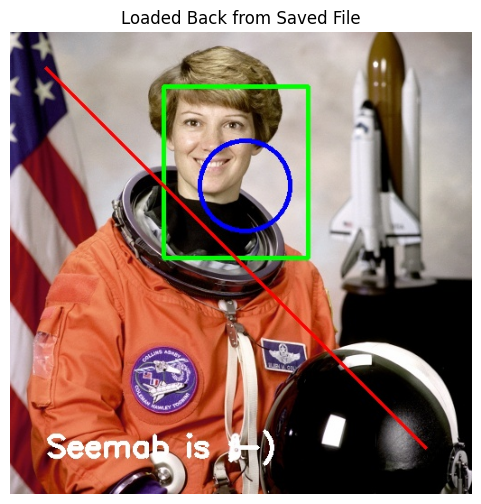

In [ ]:
saved_bgr = cv2.imread(str(drawn_output_path))
saved_rgb = cv2.cvtColor(saved_bgr, cv2.COLOR_BGR2RGB)

show_image(saved_rgb, "Loaded Back from Saved File")

## 16. Mini Recap

In this notebook, we used OpenCV to perform practical image operations.

The most important ideas:

- OpenCV reads color images in **BGR** order.
- Matplotlib displays color images in **RGB** order.
- Brightness changes usually add or subtract values.
- Contrast changes usually scale pixel values.
- Flipping and rotation move pixels around spatially.
- Thresholding turns grayscale images into binary-like masks.
- Blurring smooths local neighborhoods.
- Edge detection highlights sharp changes.
- Drawing is useful for visualizing annotations and model outputs.
- Saving processed images lets us store results for later use.

The deeper lesson:

```python
image processing = transforming image tensors
```

# 17. Challenges

Now try these yourself.

The goal is to write code, experiment, and observe the result. Do not just run the earlier cells again. Change values and explain what happens.

## Challenge 1: BGR vs RGB Mistake

Load the sample image using OpenCV.

Your task:

1. Display it once without converting BGR to RGB.
2. Display it again after converting BGR to RGB.
3. Explain why the colors looked wrong the first time.

In [ ]:
import cv2
from skimage import data
import matplotlib.pyplot as plt

In [ ]:
sample_image = data.cat()
cv_image_bgr = cv2.cvtColor(sample_image, cv2.COLOR_RGB2BGR)

array([[[104, 120, 143],
        [104, 120, 143],
        [102, 118, 141],
        ...,
        [ 13,  27,  45],
        [ 13,  27,  45],
        [ 13,  27,  45]],

       [[107, 123, 146],
        [106, 122, 145],
        [104, 120, 143],
        ...,
        [ 13,  29,  46],
        [ 13,  29,  45],
        [ 14,  30,  47]],

       [[112, 126, 148],
        [111, 125, 147],
        [109, 122, 146],
        ...,
        [ 17,  28,  48],
        [ 18,  29,  49],
        [ 19,  30,  50]],

       ...,

       [[ 30,  58,  92],
        [ 43,  71, 105],
        [ 71,  98, 132],
        ...,
        [138, 145, 172],
        [138, 145, 172],
        [138, 145, 172]],

       [[ 60,  92, 128],
        [ 71, 103, 139],
        [ 64,  95, 134],
        ...,
        [132, 142, 166],
        [132, 142, 166],
        [133, 143, 167]],

       [[ 71, 103, 139],
        [ 57,  88, 127],
        [ 53,  86, 125],
        ...,
        [127, 137, 161],
        [127, 137, 161],
        [128, 138, 162]]], dtype=uint8)
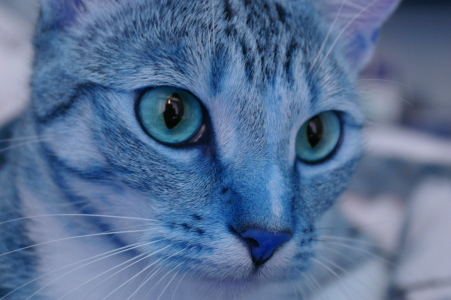

In [ ]:
cv_image_bgr

In [ ]:
cv_image_rgb = cv2.cvtColor(cv_image_bgr, cv2.COLOR_BGR2RGB)

array([[[143, 120, 104],
        [143, 120, 104],
        [141, 118, 102],
        ...,
        [ 45,  27,  13],
        [ 45,  27,  13],
        [ 45,  27,  13]],

       [[146, 123, 107],
        [145, 122, 106],
        [143, 120, 104],
        ...,
        [ 46,  29,  13],
        [ 45,  29,  13],
        [ 47,  30,  14]],

       [[148, 126, 112],
        [147, 125, 111],
        [146, 122, 109],
        ...,
        [ 48,  28,  17],
        [ 49,  29,  18],
        [ 50,  30,  19]],

       ...,

       [[ 92,  58,  30],
        [105,  71,  43],
        [132,  98,  71],
        ...,
        [172, 145, 138],
        [172, 145, 138],
        [172, 145, 138]],

       [[128,  92,  60],
        [139, 103,  71],
        [134,  95,  64],
        ...,
        [166, 142, 132],
        [166, 142, 132],
        [167, 143, 133]],

       [[139, 103,  71],
        [127,  88,  57],
        [125,  86,  53],
        ...,
        [161, 137, 127],
        [161, 137, 127],
        [162, 138, 128]]], dtype=uint8)
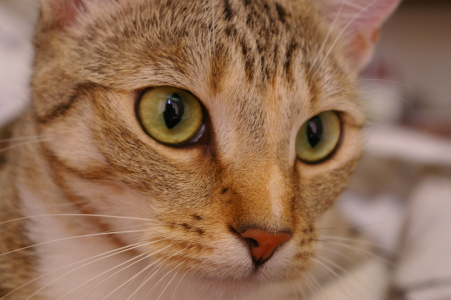

In [ ]:
cv_image_rgb

**Explain why the colors looked wrong the first time.**
Open CV reads an image channels as BGR instead of conventional RGB. So when we try to display image as RGB we get different colors then expected.

## Challenge 2: Brightness and Contrast Experiment

Create four versions of the image:

1. darker image
2. brighter image
3. low-contrast image
4. high-contrast image

Display all four side by side.

Question:

Which operation makes the image easier to see? Which operation destroys detail?

In [ ]:
cv_image_rgb_lighter = cv2.convertScaleAbs(cv_image_rgb, alpha=1, beta=50)
cv_image_rgb_darker = cv2.convertScaleAbs(cv_image_rgb, alpha=1, beta=-50)

cv_image_rgb_high_contrast = cv2.convertScaleAbs(cv_image_rgb, alpha=1.8, beta=0)
cv_image_rgb_low_contrast = cv2.convertScaleAbs(cv_image_rgb, alpha=0.7, beta=0)

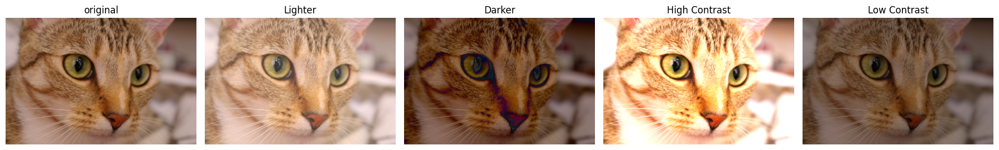

In [ ]:
fig, axes = plt.subplots(1, 5, figsize=(18, 5))

axes[0].imshow(cv_image_rgb)
axes[0].set_title("original")
axes[0].axis("off")

axes[1].imshow(cv_image_rgb_lighter)
axes[1].set_title("Lighter")
axes[1].axis("off")

axes[2].imshow(cv_image_rgb_darker, vmin=0, vmax=255)
axes[2].set_title("Darker")
axes[2].axis("off")

axes[3].imshow(cv_image_rgb_high_contrast, vmin=0, vmax=255)
axes[3].set_title("High Contrast")
axes[3].axis("off")

axes[4].imshow(cv_image_rgb_low_contrast, vmin=0, vmax=255)
axes[4].set_title("Low Contrast")
axes[4].axis("off")

plt.tight_layout()
plt.show()

**Which operation makes the image easier to see? Which operation destroys detail?**

The cat's eye show better reflection when contrast is high. When contrast is low the spatial features are less prominent.

## Challenge 3: Build a Simple Binary Mask

Convert the image to grayscale and apply thresholding.

Your task:

1. Try at least three threshold values.
2. Display the results side by side.
3. Pick the threshold that best separates bright regions from dark regions.

Question:

What information is lost when we convert the image into a binary mask?

In [ ]:
cv_image_gray = cv2.cvtColor(cv_image_rgb, cv2.COLOR_RGB2GRAY)

threshold_values = [50, 100, 125, 150, 175]
max_pix_value = 255
results = []
for tv in threshold_values:
  _, threshold_image = cv2.threshold(cv_image_gray, tv, max_pix_value, cv2.THRESH_BINARY)
  results.append(threshold_image)

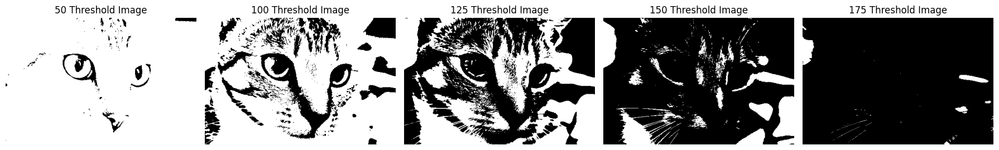

In [ ]:
fig, axes = plt.subplots(1, len(threshold_values), figsize=(18, 5))

for i, (tv, threshold_image) in enumerate(zip(threshold_values, results)):
  axes[i].imshow(threshold_image, cmap="gray")
  axes[i].set_title(f"{tv} Threshold Image")
  axes[i].axis("off")

plt.tight_layout()
plt.show()

**What information is lost when we convert the image into a binary mask?**

We loose the color information from the image when converted to binary mask. We do loose the data that was a noise or not necessary information like Background.

## Challenge 4: Blur Before Edge Detection

Edge detection can be sensitive to noise and small details.

Your task:

1. Convert the image to grayscale.
2. Apply Canny edge detection directly.
3. Blur the grayscale image.
4. Apply Canny edge detection again.
5. Compare the edge maps.

Question:

How does blurring change the detected edges?

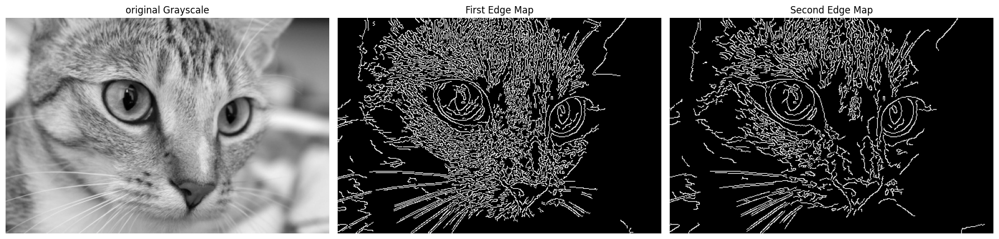

In [ ]:
cv_image_gray = cv2.cvtColor(cv_image_rgb, cv2.COLOR_RGB2GRAY)

edge_map_1 = cv2.Canny(cv_image_gray, 50, 100)

cv_image_gray_blur = cv2.GaussianBlur(cv_image_gray, ksize=(3, 3), sigmaX=0)

edge_map_2 = cv2.Canny(cv_image_gray_blur, 50, 100)


fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].imshow(cv_image_gray, cmap="gray")
axes[0].set_title("original Grayscale")
axes[0].axis("off")

axes[1].imshow(edge_map_1, cmap="gray")
axes[1].set_title("First Edge Map")
axes[1].axis("off")

axes[2].imshow(edge_map_2, vmin=0, vmax=255, cmap="gray")
axes[2].set_title("Second Edge Map")
axes[2].axis("off")

plt.tight_layout()
plt.show()

**How does blurring change the detected edges?**

After blurring the tiny details, I just have been missed such as in the eyes of the cat.

## Challenge 5: Draw Your Own Annotation

Create a copy of the original image and draw on it.

Your task:

1. Draw at least one rectangle.
2. Draw at least one circle.
3. Add a text label.
4. Save the annotated image to disk.
5. Read it back and display it.

Question:

Why is drawing useful in computer vision projects?

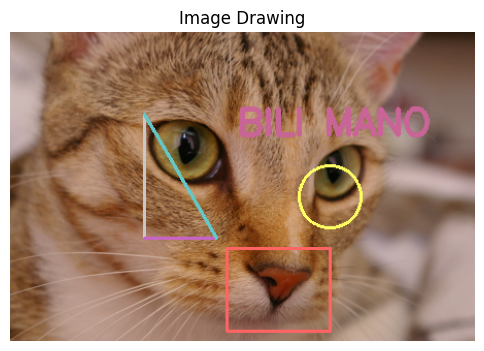

In [ ]:
drawn_image = cv_image_rgb.copy()

# lines forming triangle
cv2.line(drawn_image, (130, 80), (130, 200), (200, 200, 200), 2)
cv2.line(drawn_image, (130, 200), (200, 200), (200, 100, 200), 2)
cv2.line(drawn_image, (200, 200), (130, 80), (100, 200, 200), 2)

cv2.circle(drawn_image, (310, 160), 30, (255, 255, 100), 2)

cv2.rectangle(drawn_image, (210, 210), (310, 290), (255, 100, 100), 2)

cv2.putText(drawn_image, "BILI MANO", (220, 100), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (200, 100, 150), 3)

show_image(drawn_image, "Image Drawing")

In [ ]:
cv2.imwrite("annotated_image.jpeg", drawn_image)

True

In [ ]:
read_drawn_image = cv2.imread("annotated_image.jpeg")

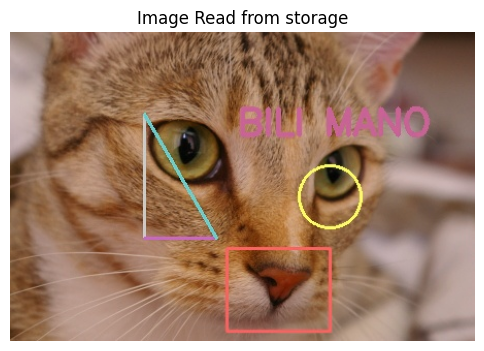

In [ ]:
show_image(read_drawn_image, "Image Read from storage")

**Why is drawing useful in computer vision projects?**

Drawing can be use to show present models output.

## Challenge 6: Your Own Image

Upload or provide your own image path.

Your task:

1. Read it using OpenCV.
2. Convert it to RGB for display.
3. Print its shape, dtype, minimum value, and maximum value.
4. Apply one brightness change.
5. Apply one blur.
6. Apply edge detection.
7. Save one processed output.

Question:

Did your own image behave differently from the sample image? Why might that be?

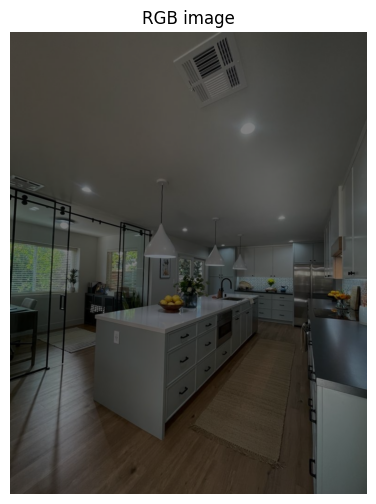

((2000, 1545, 3), dtype('uint8'), np.uint8(0), np.uint8(127))

In [9]:
import cv2
import matplotlib.pyplot as plt

def show_image(image, title="Image", cmap=None, figsize=(6, 6)):
    plt.figure(figsize=figsize)
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis("off")
    plt.show()

# Read it using OpenCV
image_bgr = cv2.imread("demo.png")

# Convert it to RGB for display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

show_image(image_rgb, "RGB image")

# Print its shape, dtype, minimum value, and maximum value
image_rgb.shape, image_rgb.dtype, image_rgb.min(), image_rgb.max()

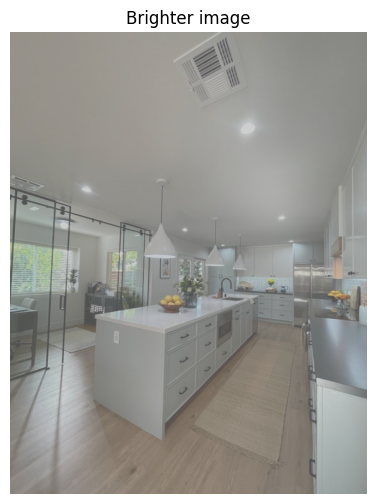

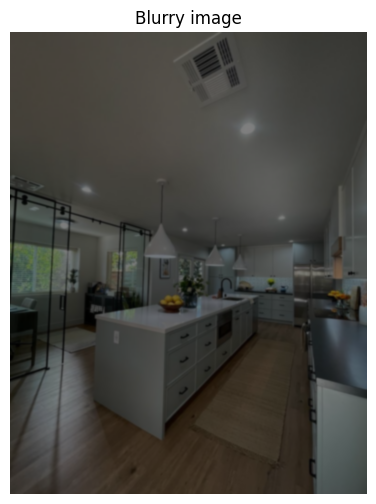

In [20]:
# Apply one brightness change

brighter_image_rgb = cv2.convertScaleAbs(image_rgb, alpha=1, beta=80)
show_image(brighter_image_rgb, "Brighter image")

# Apply one blur
blurry_image_rgb = cv2.GaussianBlur(image_rgb, ksize=(17, 17), sigmaX=0)
show_image(blurry_image_rgb, "Blurry image")

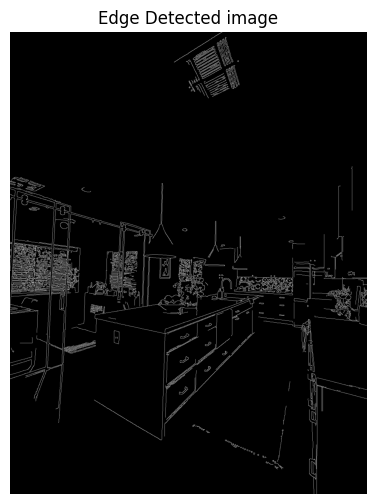

True

In [25]:
# Apply edge detection
edge_image_rgb = cv2.Canny(image_rgb, 50, 100)
show_image(edge_image_rgb, "Edge Detected image", cmap="gray")


# Save one processed output.
cv2.imwrite("edge_image.jpeg", edge_image_rgb)

Did your own image behave differently from the sample image? Why might that be?

My image was not sharp. So when we applied GaussianBlur it didn't changed much.

## Final Reflection

Write a short answer in your own words:

```markdown
The most surprising thing I learned about OpenCV images is:
The legacy use of BGR channels because shifting to RGB would cause a lot of legacy code to break.

The operation I understood best is:
Brightness/contrast are best I understood and it can be used to increase the chances of reading more information from the website.

The operation I still need to practice is:
GaussianBlur might need more time to master it.

One place I can imagine using OpenCV in a real project is:
I can use the Edge detector like Canny or Sobel to detect edges which are the fundamentals to detect objects.
```